In [1]:
import os
#os.environ['OPENBLAS_NUM_THREADS'] = '1'

import scanpy as sc
import scanpy.external as sce
import anndata as ad
import pandas as pd
# Data retrieval
import pooch
import scanpy.external as sce

sc.settings.set_figure_params(dpi=100, facecolor="white")

ensg=pd.read_table('/sc/arion/projects/roussp01a/liting/Olf/Homo.GRCh38.104.txt',index_col=0)
chr_autos = [format(x, '1d') for x in range(1,23)]
ensg_pa = ensg.loc[(ensg.chr.isin(chr_autos)) & (ensg.gene_biotype=='protein_coding'),:]

cmc_dir='/sc/arion/projects/CommonMind/roussp01a/ENT/snRNAseq/'
adata = sc.read_h5ad(cmc_dir + 'qc_scanpy/ENT_outerMerge.h5ad')
adata.var_names=pd.DataFrame(adata.var_names)['index'].str.split('_',expand=True)[0]

adata = adata[:,list(set(adata.var_names) & set(ensg.index))]

adata.var.index= ensg.loc[adata.var_names,'gene_name']

adata.var_names_make_unique() 

adata.obs.batch = adata.obs.batch.str.replace('_cDNA', '')
adata.obs['batch_doner'] = 'ENT-'+ adata.obs.batch.astype(str) + '-'+ adata.obs.SubID_vs.astype(str)
adata.obs['batch_doner'] = adata.obs['batch_doner'].str.replace('_', '-', regex=False)



adata.obs["Set"]=adata.obs["set"].str.split('_',expand=True)[0]

adata.obs.index=adata.obs['batch'].astype(str) +"_"+ adata.obs.index.astype(str) 

#adata.obs.to_csv(cmc_dir+ "qc_scanpy/ent.metadata")
adata = adata[~adata.obs.SubID_vs.isin(['Doublet','Negative'])]


doner_set=pd.read_table('/sc/arion/projects/roussp01a/liting/Olf/data/donors_qtltools.tsv',index_col=1)
adata.obs["donor_name"] = doner_set.loc[adata.obs.batch_doner,'qtltools_donID' ].values


/hpc/users/songl05/.conda/envs/Py39_R43_Ju10/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/users/songl05/.conda/envs/Py39_R43_Ju10/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/users/songl05/.conda/envs/Py39_R43_Ju10/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/users/songl05/.conda/envs/Py39_R43_Ju10/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/users/songl05/.conda/envs/Py39_R43_Ju1

In [ ]:
meta=pd.read_table(cmc_dir + 'preprocessed_data/ENT_merged_metadata.tsv')
# meta data
meta['donor_name']= 'ENT-'+meta['MRN'].astype(str)
meta=meta[['donor_name','Age', 'Sex', 'PMH','Smoking status', 'History of COVID', 'Indication for surgery']]
meta=meta.drop_duplicates(subset='donor_name')
adata.obs['ID'] = adata.obs.index
x = pd.merge( adata.obs, meta, on='donor_name')
x.index=x['ID']
x=x.loc[adata.obs['ID'],:]

adata.obs=x

# set info
set_info={
"Set1":"Right superior turbinate",
"Set2":"Left superior turbinate",
"Set3":"Right middle turbinate",
"Set4":"Left middle turbinate",
"Set5":"Right superior septum",
"Set6":"Left superior septum"}


adata.obs["Set"]=adata.obs["set"].str.split('_',expand=True)[0]
adata.obs["Set_info"]=adata.obs["Set"].map(set_info)


In [3]:
import os
#os.environ['OPENBLAS_NUM_THREADS'] = '1'

import scanpy as sc
import scanpy.external as sce
import anndata as ad
import pandas as pd
# Data retrieval
import pooch
import scanpy.external as sce
cmc_dir='/sc/arion/projects/CommonMind/roussp01a/ENT/snRNAseq/'
meta=pd.read_table(cmc_dir + 'preprocessed_data/ENT_merged_metadata.tsv')
# meta data
meta['donor_name']= 'ENT-'+meta['MRN'].astype(str)
meta=meta[['donor_name','Age', 'Sex', 'PMH','Smoking status', 'History of COVID', 'Indication for surgery']]
meta=meta.drop_duplicates(subset='donor_name')
meta.to_csv('./data/clinical.info.csv')

## Quality Control

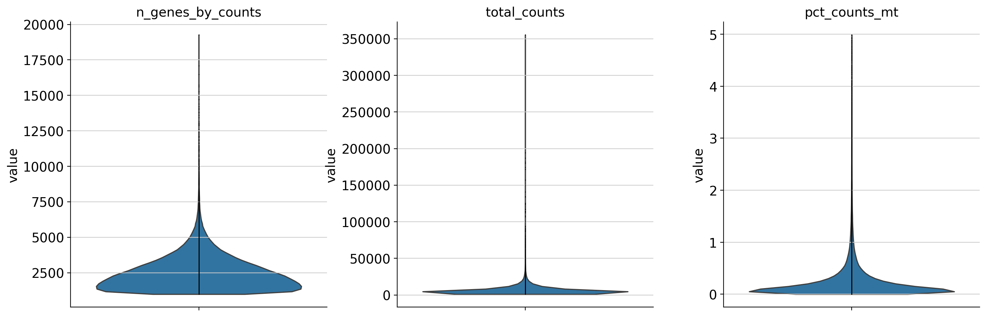

(155421, 35162)
(155113, 35162)


In [3]:
# mitochondrial genes, "MT-" for human, 
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")


sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=False,
    multi_panel=True,
    save='1_ENT_violin_qc.pdf'
)

#sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

print(adata.shape)

sc.pp.filter_cells(adata, min_genes=1000)
sc.pp.filter_genes(adata, min_cells=3)

# # # Do the filtering
adata = adata[(adata.obs.pct_counts_mt < 5) & 
(adata.obs.n_genes_by_counts < 10000) & 
(adata.obs.total_counts < 50000),:]
print(adata.shape)

adata = adata[:,list(set(adata.var_names) & set(ensg_pa.gene_name))]



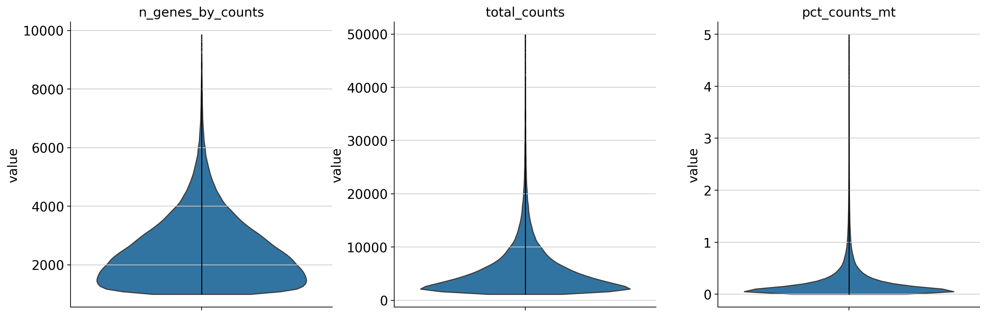

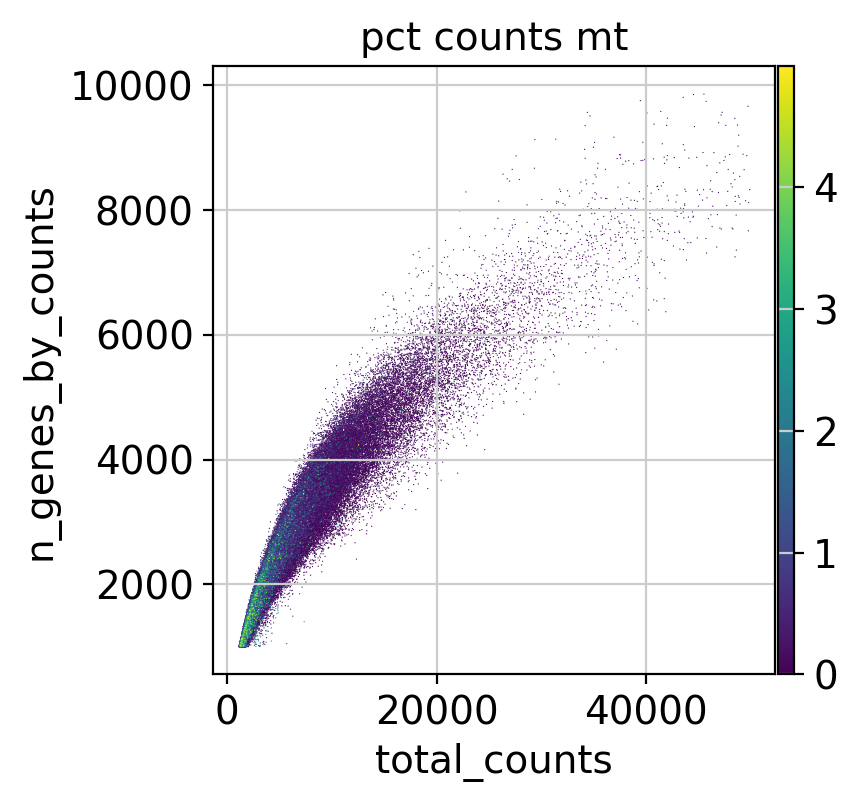

In [4]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=False,
    multi_panel=True,
)
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")


### Doublet detection

In [5]:
# Doublet detection
# for each single sample
samples = adata.obs['Set'].unique()

adata_split = []
for sample in samples:
    adata_split.append(adata[adata.obs.Set == sample].copy())

for adata_sample in adata_split:
    sc.pp.scrublet(adata_sample)  

adata_processed = ad.concat(adata_split,join="outer",index_unique=None )
sc.write(cmc_dir+"qc_scanpy/ent_processed.h5ad", adata_processed)


In [3]:
adata_processed = sc.read_h5ad(cmc_dir + 'qc_scanpy/ent_processed.h5ad')

adata = adata_processed.copy()
adata = adata[(adata.obs.predicted_doublet ==False)&(adata.obs.doublet_score < 0.15)]

In [4]:
adata.shape

(147008, 16888)

##  Normalization

In [5]:

# Saving count data
adata.layers["counts"] = adata.X.copy()
# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)


/tmp/ipykernel_2027664/2341539176.py:2: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  adata.layers["counts"] = adata.X.copy()


## Feature selection

In [6]:
sc.pp.highly_variable_genes(adata, n_top_genes=5000, batch_key = 'Set')#, add batch and only PC
#sc.pp.highly_variable_genes(adata,min_mean=0.0125, max_mean=3, min_disp=0.25)

adata.raw = adata # adata=adata.to_adata()

# adata = adata[:,adata.var.highly_variable]
# sc.pp.regress_out(adata, ["total_counts", "pct_counts_mt"])
# sc.pp.scale(adata, max_value=10)

## Dimensionality Reduction

/hpc/users/songl05/.conda/envs/Py39_R43_Ju10/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


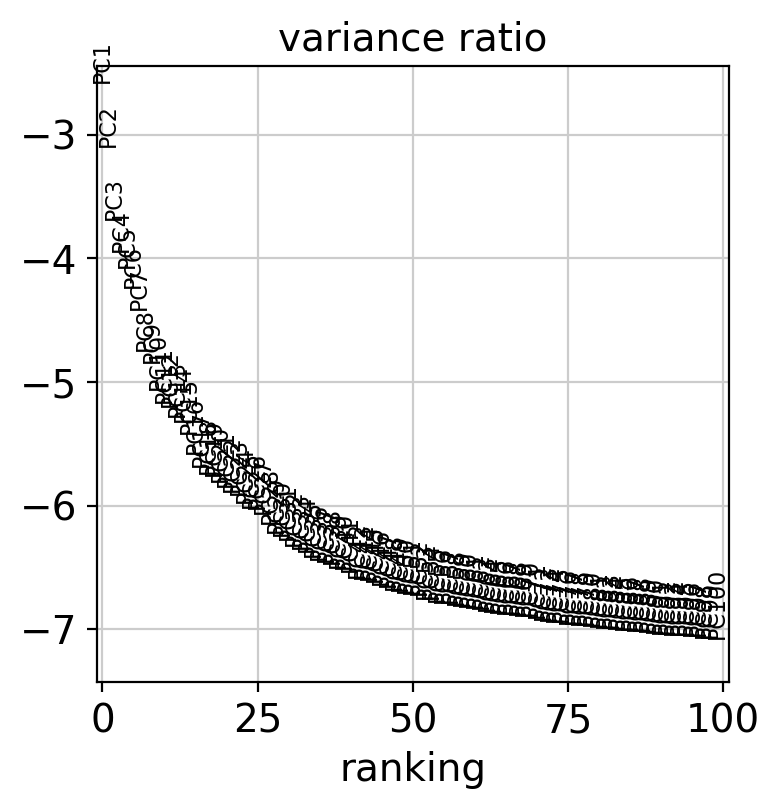

In [7]:

sc.tl.pca(adata, use_highly_variable=True, n_comps=100)
sc.pl.pca_variance_ratio(adata, n_pcs=100, log=True)


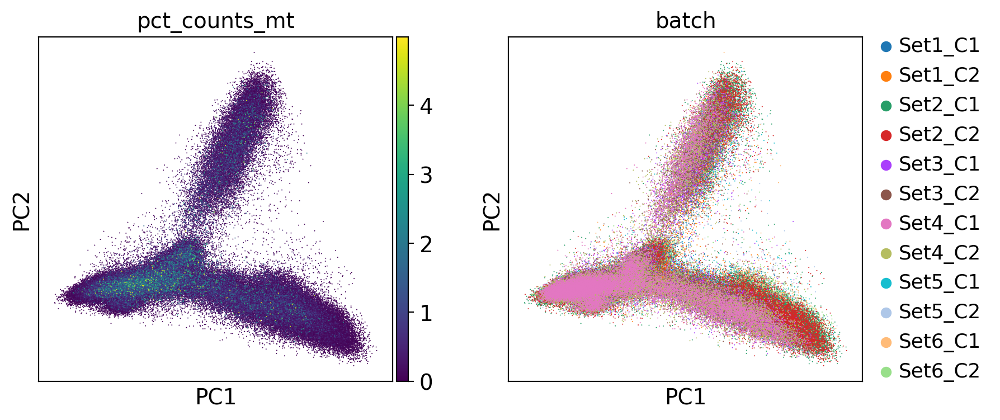

In [8]:
# plot the principal components to see if there are any potentially 
# undesired features (e.g. batch, QC metrics) driving signifigant variation in this dataset

sc.pl.pca(
    adata,
    color=[ "pct_counts_mt","batch"],
    size=2,
)

## Nearest neighbor graph constuction and visualization

In [9]:
# UMAP
sc.pp.neighbors(adata,  n_pcs=50)
sc.tl.umap(adata)


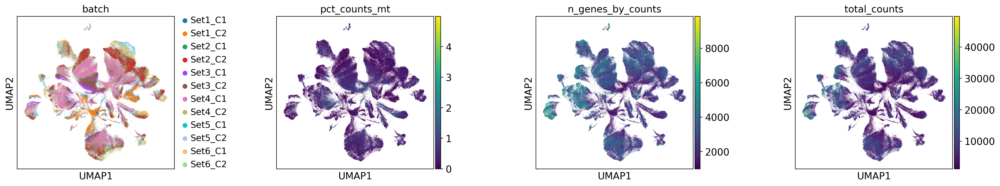

In [10]:
sc.tl.leiden(adata, flavor="igraph", resolution=1)

sc.pl.umap(
    adata,
    color=['batch','pct_counts_mt',"n_genes_by_counts", "total_counts"],#,'doublet_score','predicted_doublet'],
    # Setting a smaller point size to get prevent overlap
    size=1,
    wspace=0.5,
    save='1_ENT_cell_beforeBatch.pdf'
)

## Batch effects

In [11]:
sce.pp.harmony_integrate(adata, ['Set', 'donor_name'])

2024-09-27 20:12:31,570 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-09-27 20:12:42,703 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-09-27 20:12:43,212 - harmonypy - INFO - Iteration 1 of 10
2024-09-27 20:13:26,548 - harmonypy - INFO - Iteration 2 of 10
2024-09-27 20:14:09,570 - harmonypy - INFO - Iteration 3 of 10
2024-09-27 20:14:51,335 - harmonypy - INFO - Converged after 3 iterations


In [12]:
adata.obsm['X_pca'] = adata.obsm['X_pca_harmony']
sc.pp.neighbors(adata,  n_pcs=50 ,n_neighbors = 20)


In [13]:
sc.tl.umap(adata )

sc.tl.leiden(adata, resolution=1)

sc.tl.leiden(adata, flavor="igraph", key_added="leiden_res0_1", resolution=0.1)

sc.tl.leiden(adata, flavor="igraph", key_added="leiden_res0_5", resolution=0.5)

sc.tl.leiden(adata, flavor="igraph", key_added="leiden_res1_5", resolution=1.5)

sc.tl.leiden(adata, flavor="igraph", key_added="leiden_res2", resolution=2)


/tmp/ipykernel_2027664/91223129.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=1)


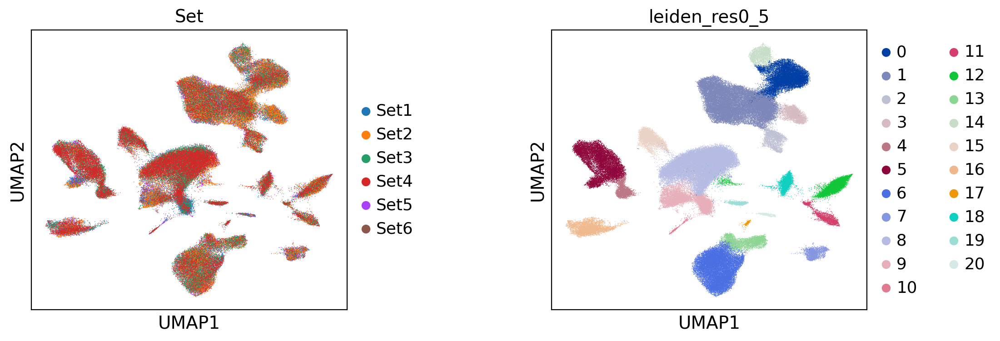

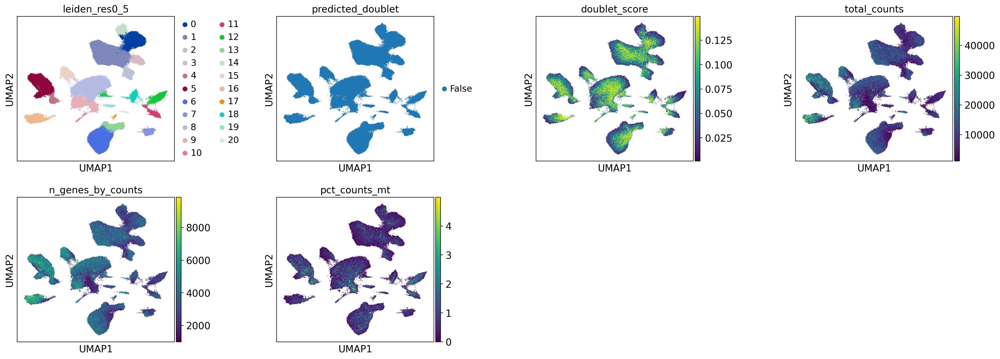

In [18]:
sc.pl.umap(
    adata,
    color=['Set','leiden_res0_5'],
    # Setting a smaller point size to get prevent overlap
    size=1,
    wspace=0.5,
    save='1_ENT_cell_afterBatch.pdf'
)
sc.pl.umap(
    adata,
    color=["leiden_res0_5", "predicted_doublet", "doublet_score",
          "total_counts", "n_genes_by_counts",'pct_counts_mt'],
    wspace=0.5,
    size=3,
   save='1_ENT_cellQC_afterBatch.pdf'
)

categories: 0, 1, 2, etc.
var_group_labels: T cells, B cells, Macrophage, etc.


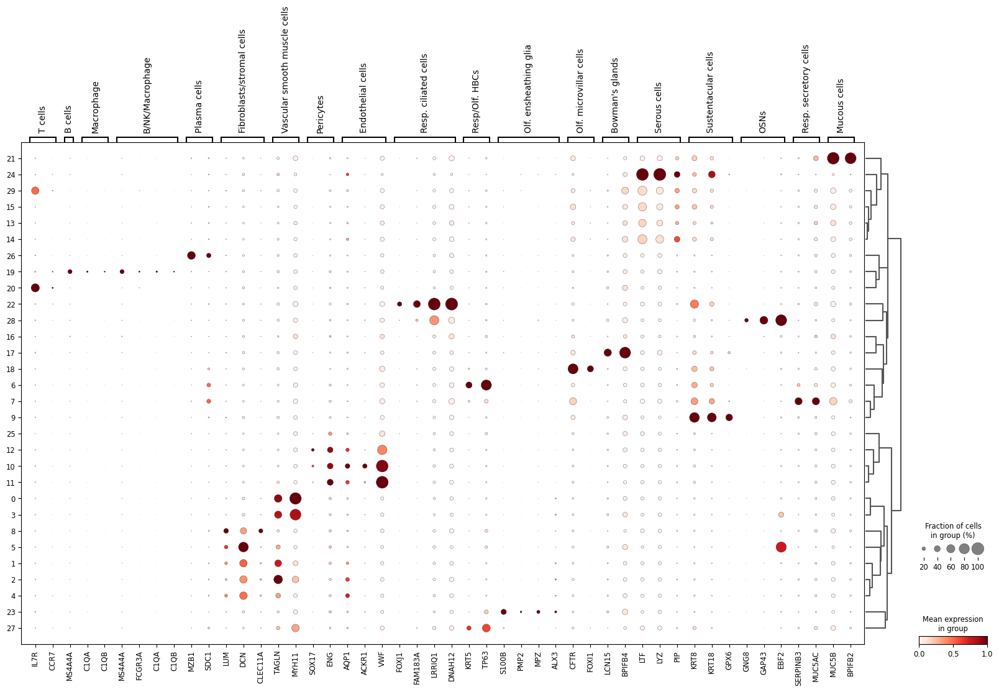

In [17]:
# marker_genes={
# # "T cells":["IL7R", "CCR7","CD8A" ,'CD3D', 'CD3E', 'IL7R'],
# # "B cells": [ "CD19", "CD20", "CD40", 'CD79A', 'MS4A4A'],
# # "NK": ['FGFBP2', 'FCGR3A', 'CX3CR1'],
# # "Plasma cells":["MZB1","SDC1","CD79A"],
# # "Monocytes":["CD14",'LYZ',"S100A12","CLEC10A"],
# # "Macropage":['CD68', 'CD11A',"C1QA","C1QB","C1QC"],
# # "Dendric":["CD1C"],
# # "Mast":["TPSB2","TPSAB1"],
# # "Fibroblasts/stromal cells":["LUM","DCN","CLEC11A"],
# "Resp. ciliated cells":["FOXJ","CFAP126","STOML3"],
# "Resp. secretory cells":["MUC5","CYP4B1","TFF3",],
# #"Resp. Epithelial cells":['BPIFB1','PIP'],
# "Sustentacular cells":["CYP2A13","CYP2J2","GPX6","ERMN","SOX2"],
# "Resp. HBCs":["KRT5","TP63","SOX2"],
# "Resp. GPCs":["SOX9","SCGB1A1"],
# "Resp/Olf. HBCs":["KRT5","TP63","SOX2","CXCL14","MEG3"],
# "Vascular smooth muscle cells":["TAGLN","MYH11"],
# "Pericytes":["SOX17","ENG"],
# #"Submucosal Gland":['TOX3','MLPH','MUC5B'],
# "Bowman’s glands":["SOX9", "SOX10", "MUC5", "GPX3",'TA98','TA2','TH','FMA'],
# "Olf. Ensheathing Glia":["S100B","PLP1","PMP2","MPZ","ALX3"],
# "Olf. Microvillar cells":["ASCL3","CFTR","HEPACAM2","FOXL1"],
# "Olf. HBCs":["TP63","CXCL14","MEG3"],
# #"Progenitors":['ASCL1'],
# "Precursors":["NOTCH1","HES6","ASCL1","CXCR4","SOX2","EZH2","NEUROD1","NEUROG1"],
# # "Immature_N":["GNG8",'GAP43',"OLIG2","EBF2","LHX2","CBX8",'TUJ1'],
# # "Mature_mouse_N":["GNAL","ADCY3","CNGA2","CNGA4"],
# # "Mature_N":["GNG13","EPHA7","UNC5B","EBF2","CBX8","RTP1"],
# # "Neurons":['GNG8','GAP43','EBF2'],
# "unknow":[''],
# "Secretory":["MUC5B", "TFF3", "SCGB3A1", "BPIFB1", "MSMB", "SLPI", "WFDC2"],
# "Ciliated":["FOXJ1", "PIFO", "TPPP3", "SNTN", "FAM183A", "LRRIQ1", "DNAH12", "C20orf85", "SNTN", "CAPS", "TUBB4B", "DNAH5", "TSPAN1"]   ,
# 'GLAND': ["LCN15",'ACE2',"SOX9", "GPX3"],#,'CK18', "FOXJ1", "EPCAM", "KRT7" ,"KRT8",  "MUC5AC", "EPCAM", "MUC5AC", "KRT5", "KRT6", "UGT2A1", "GPX3", "SOX2", "ERMN", "KRT18"] ,
# #OMP, AON2, CNGA2, GNAL, UGT2A1, GPX3, KRT18,]
#     "DUCT": ["EPCAM", "MUC5AC",'KRT8'],
#     'SUS':['CYP2A13', 'CYP2J2',"UGT2A1", "GPX3", "SOX2", "ERMN", "KRT18"],
#     'MV':["ASCL3", "CFTR", "FOXI1"],
    
#     "1Resp. secretory cells": ["MUC5AC", "MUC5B", "SCGB1A1", "SFTPB", "CC10"],
# "2Sustentacular cells": [ "SOX2", "CLDN1", "OLFM3","MUC1"],
# "3Bowman's Glands": ["MUC5B", "LYZ", "CLDN1", "TGM2"],
# }


marker_genes={
"T cells":["IL7R", "CCR7"],
"B cells": [  'MS4A4A'],
"Macrophage":["C1QA","C1QB"],
"B/NK/Macrophage":['MS4A4A','FCGR3A',"C1QA","C1QB"],
"Plasma cells":["MZB1","SDC1"],
"Fibroblasts/stromal cells":["LUM","DCN","CLEC11A"],
"Vascular smooth muscle cells":["TAGLN","MYH11"],
"Pericytes":["SOX17","ENG"],
"Endothelial cells":['AQP1','ACKR1',"VWF",'CD31'],#"FABP4",
"Resp. ciliated cells":["FOXJ1","FAM183A", "LRRIQ1", "DNAH12"],

"Resp/Olf. HBCs":["KRT5","TP63","SOX2","MEG3"],#"CXCL14",

"Olf. ensheathing glia":["S100B","PLP1","PMP2","MPZ","ALX3"],
"Olf. microvillar cells":["CFTR", "FOXI1"],#"ASCL3", 
"Bowman's glands":["LCN15",'ACE2','BPIFB4',],#
"Serous cells" :  ['LTF','LYZ','PIP'],
"Sustentacular cells":['KRT8','KRT18',"GPX6","SOX2"],#"CYP2A13","CYP2J2","ERMN",
"OSNs":['GNG8','GAP43','EBF2'],
#"Resp. secretory cells": ["MUC5B",'MSMB', "TFF3","MUC5AC"],#, 
#"Nasal Resp. secretory cells": [  "MUC1", "S100P",'PSCA'],#, "MUC5B""SCGB1A1",'SERPINB3', "SFTPB", "CC10"
"Resp. secretory cells": ['SERPINB3' ,"MUC5AC"],#, 
"Mucous cells":['MUC5B','BPIFB2']
#serous cells
}

marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

sc.pl.dotplot(adata, marker_genes_in_data, groupby="leiden_res1_5", standard_scale="var",dendrogram=True,  save='1_ENT_cell_markerdot_leiden.pdf')


In [16]:
#sc.tl.leiden(adata, resolution=0.1, restrict_to=("leiden_res1_5",['19']),key_added='leiden_resRr')


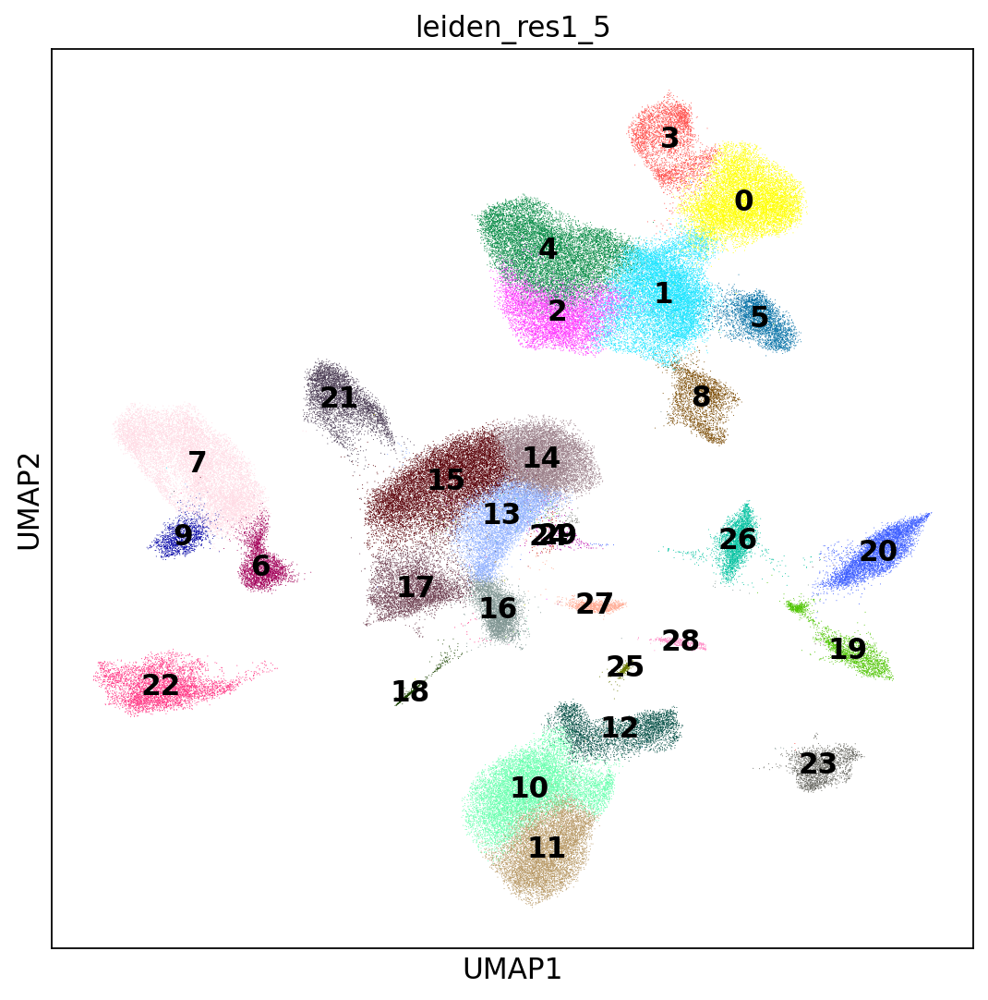

In [45]:
sc.pl.umap(
    adata,#[adata.obs['doublet_score'] < 0.15],
    legend_loc='on data',
    color=["leiden_res1_5" ],
    wspace=0.5,
)




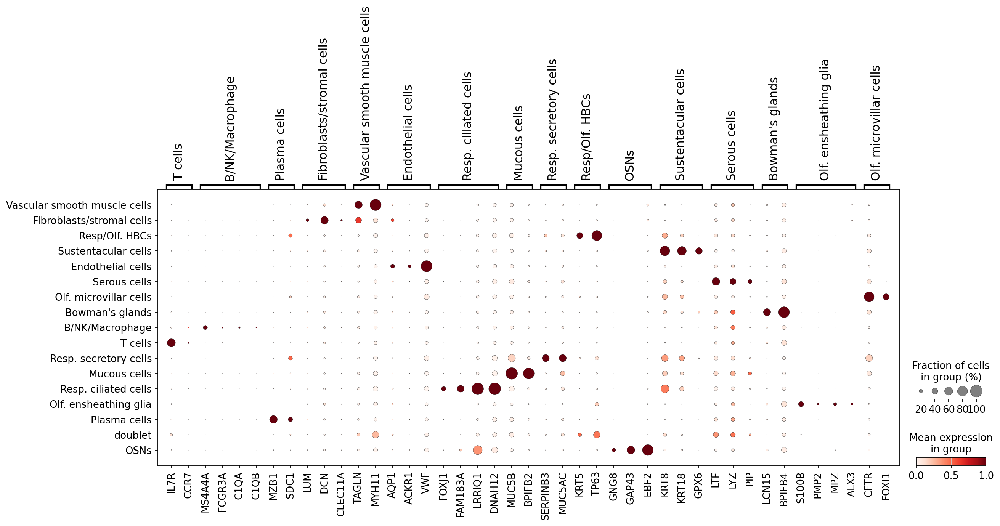

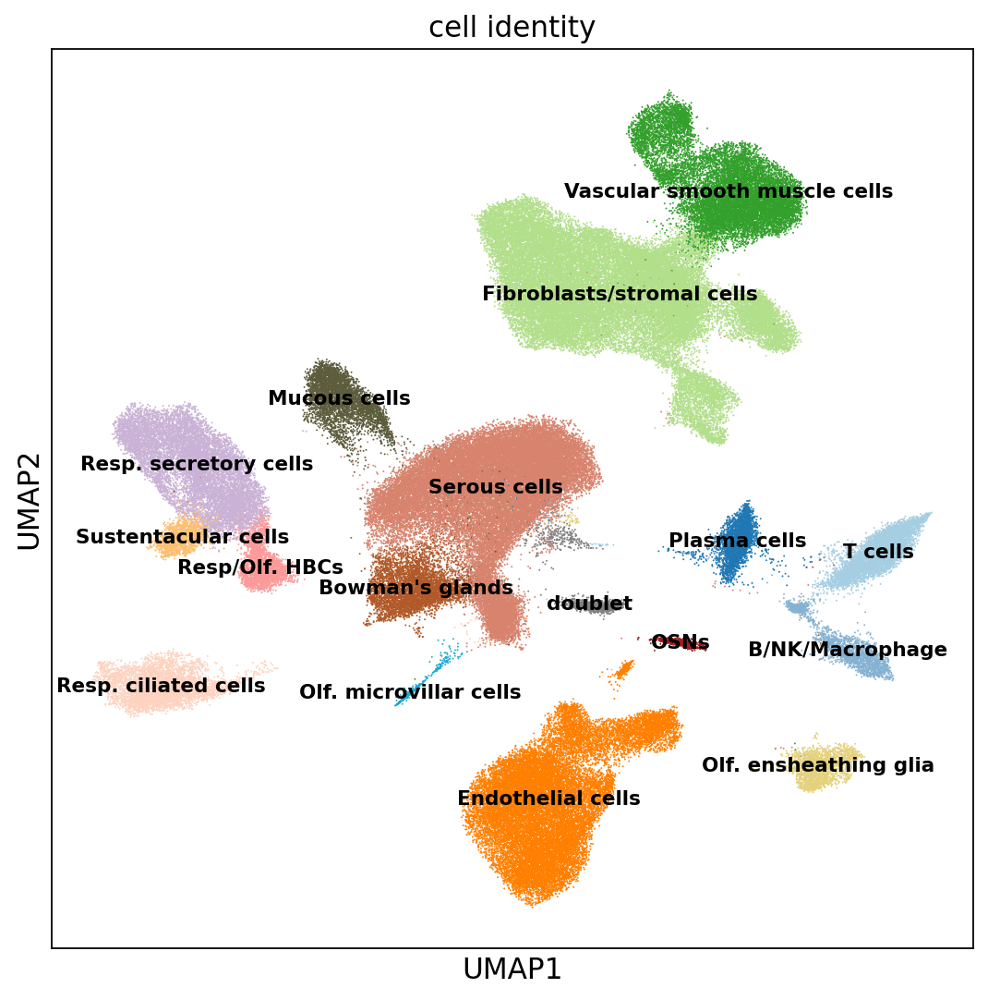

In [19]:
new_cluster_names = {
    "29": "doublet",
    "20": "T cells",
    "19": "B/NK/Macrophage",
    "26":"Plasma cells",
    
    "8": "Fibroblasts/stromal cells",
    "5": "Fibroblasts/stromal cells",
    "1": "Fibroblasts/stromal cells",
    "2": "Fibroblasts/stromal cells",
    "4": "Fibroblasts/stromal cells",
    
    "0": "Vascular smooth muscle cells",
    "3": "Vascular smooth muscle cells",
    
    "10": "Endothelial cells",
    "11": "Endothelial cells",
    "12": "Endothelial cells",
    "25": "Endothelial cells",
    
    "22": "Resp. ciliated cells",
    "21": "Mucous cells",
    "7": "Resp. secretory cells",
    
    "6": "Resp/Olf. HBCs",
    "27": "doublet",
    
    
    "28": "OSNs",
    "9":  "Sustentacular cells",
    "24": "Serous cells",
    "13": "Serous cells",
    "14": "Serous cells",
    "15": "Serous cells",
    "16": "Serous cells",
    
    "17": "Bowman's glands",
    
    "23": "Olf. ensheathing glia",
    "18":"Olf. microvillar cells",
    
    
}



adata.obs["Cell identity"] = adata.obs["leiden_res1_5"].map(new_cluster_names)
#adata.obs["Cell identity"] = adata.obs["leiden_res1_5"].map(new_cluster_names)



wanted_cells= list(new_cluster_names.values()) 
wanted_cells_marker=dict((cl, marker_genes_in_data[cl]) for cl in wanted_cells if cl in marker_genes_in_data)
sc.pl.dotplot(adata, wanted_cells_marker, groupby="Cell identity", standard_scale="var",dendrogram=False,
             save='1_ENT_cell_markerdot_all.pdf')


color_map = {
  "T cells":"#A6CEE3",
  "B/NK/Macrophage":"#85B2D2FF",
  "Plasma cells":"#1F78B4",
  "Fibroblasts/stromal cells":"#B2DF8A",
 "Vascular smooth muscle cells":"#33A02C",
"Endothelial cells":"#FF7F00",#",#86C368FF",
 "Resp. ciliated cells":"#FDD2BF",  
  "Serous cells":"#D7836D",
    "Resp. secretory cells":"#CAB2D6",
   #"Resp. secretory cells":"#A26BA5",
  "Resp/Olf. HBCs":"#FB9A99",
  "OSNs":"#A11C1F",
 "Sustentacular cells":"#FDBF6F",
  
 "Olf. ensheathing glia":"#E4D17BFF",
  "Olf. microvillar cells":"#1EAAD4",
       "Bowman's glands":"#B15928", 
    "Mucous cells":"#5D5C3C",
    'doublet':'grey'
}


# color_map = {
#   "T cells":"#7F5859",
#   "B/NK/Macrophage":"#FBCB15",
#   "Plasma cells":"#E0C96C",
#   "Fibroblasts/stromal cells":"#61B556",
#  "Vascular smooth muscle cells":"#A7C253",
# "Endothelial cells":"#1EAAD4",
#  "Resp. ciliated cells":"#476CB3",
  
#     "Resp. secretory cells":"#3C927F", 
#    "Resp. secretory cells":"#71C2B0",
#   "Resp/Olf. HBCs":"#ADA9CD",
#   "OSNs":"#A32021",
#  "Sustentacular cells":"#5D5C3C",
  
#  "Olf. ensheathing glia":"#BA96C6",
#   "Olf. microvillar cells":"#DE8295",
#        "Bowman's glands":"#7566AC", 
#     "Mucous cells":"#8E4B9B",
#     'doublet':'grey'
# }


sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(
    adata,
    color=["Cell identity" ],
    wspace=0.5,
    size=3,
    legend_loc='on data',
    legend_fontsize='x-small',
    palette=color_map,
    title='cell identity',
    save='1_ENT_cell_annotation_all.pdf'
)



/tmp/ipykernel_36833/4028002682.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_removedoublet.obs["Cell identity2"] = adata_removedoublet.obs["Cell identity"]


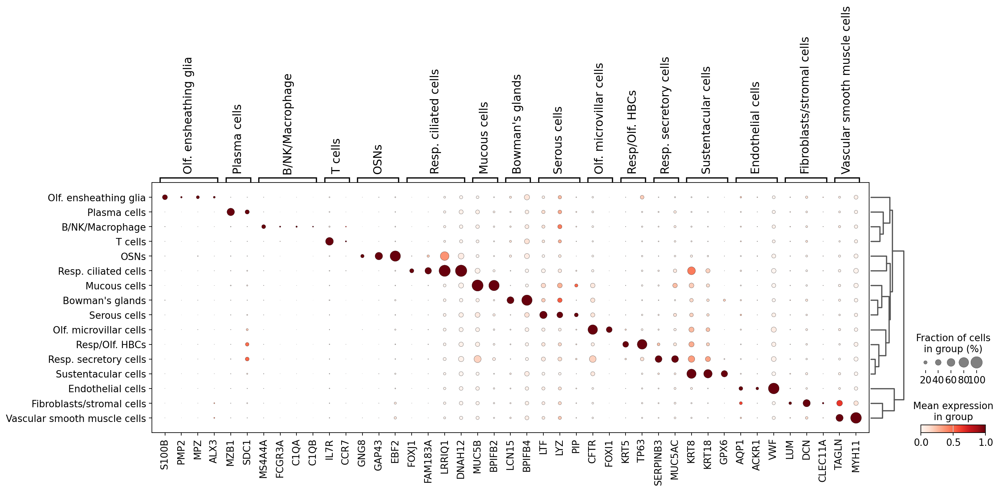

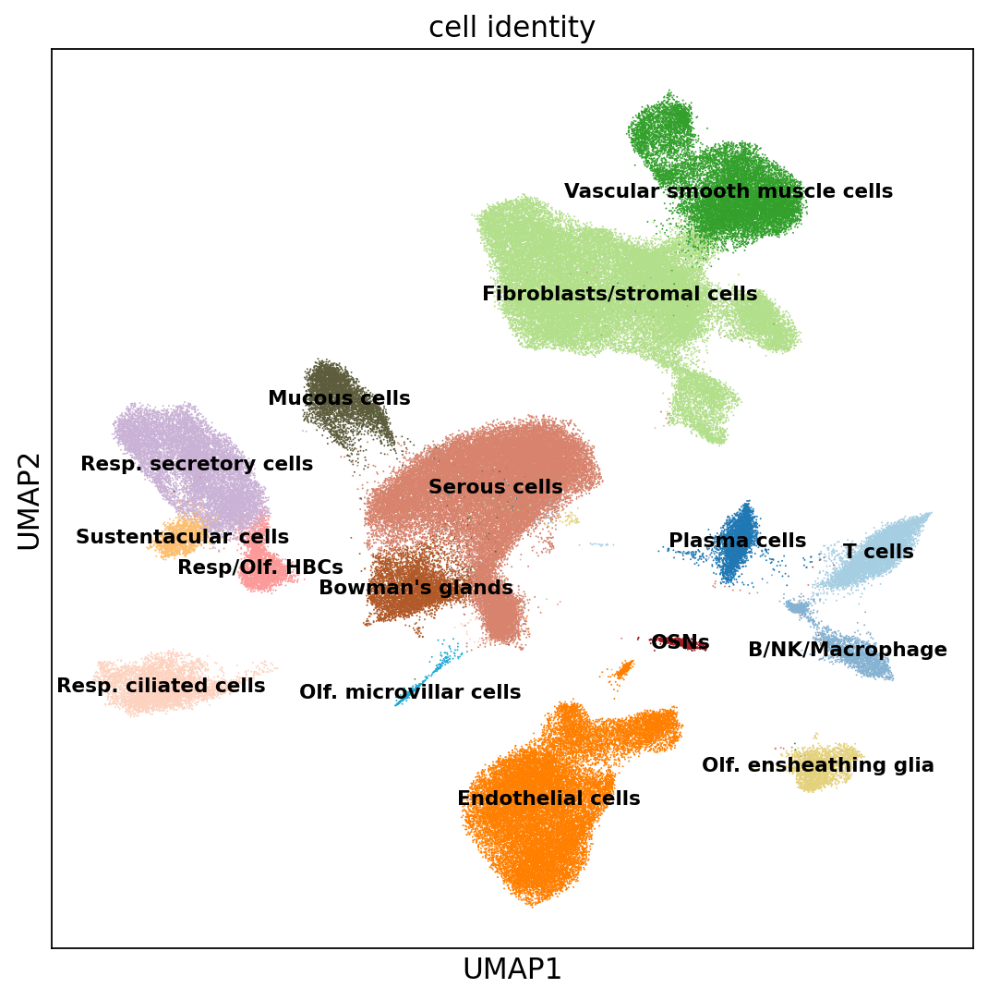

In [20]:
adata_removedoublet=adata[adata.obs["Cell identity"]!='doublet']

adata_removedoublet.obs["Cell identity2"] = adata_removedoublet.obs["Cell identity"]


wanted_cells_marker=dict((cl, marker_genes_in_data[cl]) for cl in wanted_cells if cl in marker_genes_in_data)
sc.pl.dotplot(adata_removedoublet, wanted_cells_marker, groupby="Cell identity2", standard_scale="var",dendrogram=True,
             save='1_ENT_cell_markerdot.pdf')


sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(
    adata_removedoublet,
    color=["Cell identity" ],
    wspace=0.5,
        size=3,
    legend_loc='on data',
    legend_fontsize='x-small',
    palette=color_map,
    title='cell identity',
    save='1_ENT_cell_annotation.pdf'
)



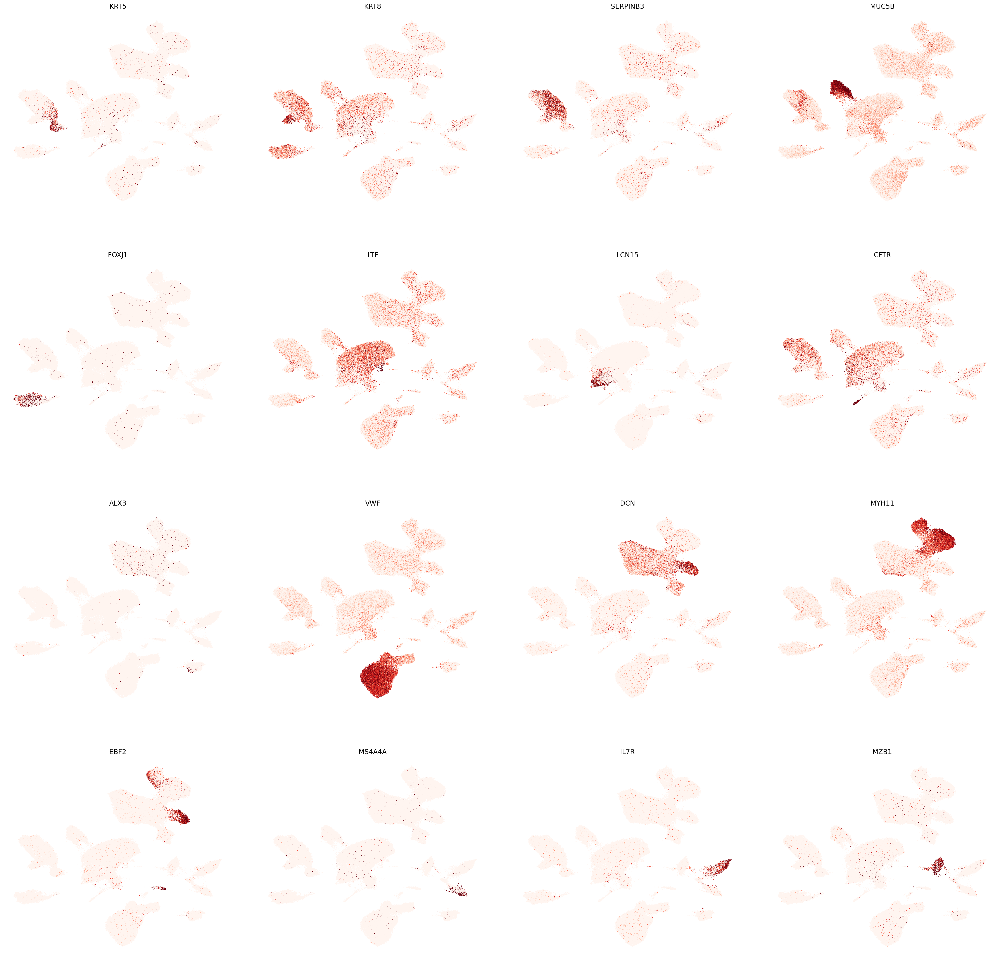

In [21]:
    
    sc.pl.umap(
        adata_removedoublet,
        legend_loc = None,
        colorbar_loc=None,
        color=['KRT5',#hbc
               'KRT8',#sus
               "SERPINB3",#sec
               'MUC5B',# sec
               'FOXJ1',#cilia
               #"LCN15",#bowman
               #'BPIFB4',#bowman
               'LTF',#bowman
               "LCN15",
               
               "CFTR",# mv
               "ALX3", #ensheting
               'VWF',# endothlial
               "DCN",# fiber
               "MYH11",#SMOoth

               'EBF2',#OSN
               
               'MS4A4A',#B cell
              
               "IL7R", #T cells
               
               "MZB1", #plasma
               
              ],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        size=8,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
        save='1_ENT_cell_marker.pdf')

In [98]:
#adata.obs=adata.obs.drop(columns=['Cell identity'])

In [22]:
sc.write(cmc_dir+'qc_scanpy/ent_cluster_merge.h5ad',adata)


In [23]:
import os
#os.environ['OPENBLAS_NUM_THREADS'] = '1'

import scanpy as sc
import scanpy.external as sce
import anndata as ad
import pandas as pd
# Data retrieval
import pooch
import scanpy.external as sce

cmc_dir='/sc/arion/projects/CommonMind/roussp01a/ENT/snRNAseq/'

#adata=sc.read(cmc_dir+'qc_scanpy/ent_cluster_merge.h5ad')
adata_processed=sc.read(cmc_dir+"qc_scanpy/ent_processed.h5ad")
adata_Mf = adata_processed[adata.obs.index]
adata_Mf.obs = adata.obs
adata_Mf.obsm = adata.obsm
sc.write(cmc_dir+"qc_scanpy/ent_cluster_rawcount.h5ad", adata_Mf)


In [ ]:
import os
#os.environ['OPENBLAS_NUM_THREADS'] = '1'

import scanpy as sc
import scanpy.external as sce
import anndata as ad
import pandas as pd
# Data retrieval
import pooch
import scanpy.external as sce

cmc_dir='/sc/arion/projects/CommonMind/roussp01a/ENT/snRNAseq/'

adata=sc.read(cmc_dir+"qc_scanpy/ent_cluster_rawcount.h5ad")


In [38]:
import os
#os.environ['OPENBLAS_NUM_THREADS'] = '1'

import scanpy as sc
import scanpy.external as sce
import anndata as ad
import pandas as pd
# Data retrieval
import pooch
import scanpy.external as sce

cmc_dir='/sc/arion/projects/CommonMind/roussp01a/ENT/snRNAseq/'

adata=sc.read(cmc_dir+'qc_scanpy/ent_cluster_merge.h5ad')


In [39]:
df=pd.DataFrame(adata.obsm["X_umap"])
df.to_csv('./data/ent_umap.txt', sep='\t', index=False)


### ----------------- part2 Reculster for neuron cells -----------------

In [122]:
#adata=sc.read(cmc_dir+'qc_scanpy/ent_cluster_merge.h5ad')

cluster_to_recluster=['28']
N_adatax=adata[adata.obs['leiden_res1_5'].isin(cluster_to_recluster)]
#adata_processed = sc.read_h5ad(cmc_dir + 'qc_scanpy/ent_processed.h5ad')


/tmp/ipykernel_17420/968582022.py:5: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  N_adata.layers["counts"] = N_adata.X.copy()
/hpc/users/songl05/.conda/envs/Py39_R43_Ju10/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


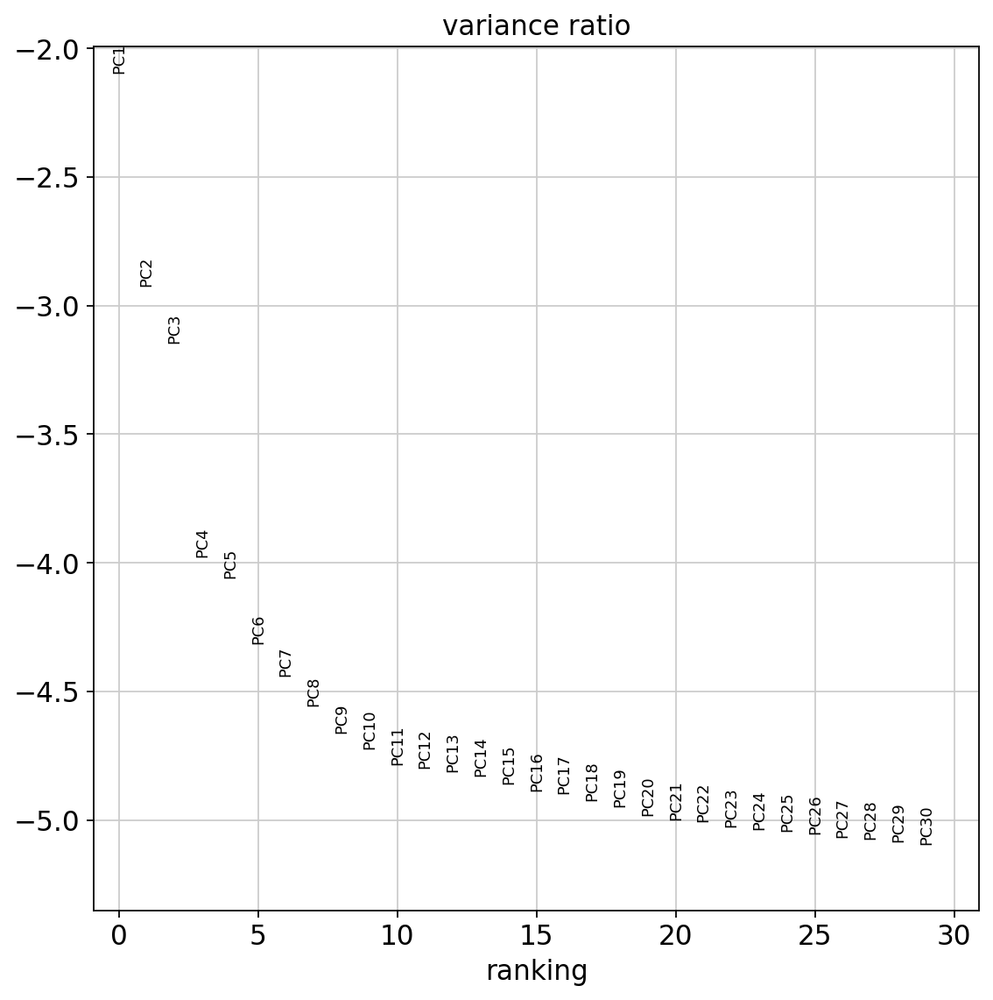

In [123]:
#adata_processed=sc.read(cmc_dir+"qc_scanpy/ent_processed_outermerge_v0805.h5ad")

N_adata=adata_processed[N_adatax.obs.index]
# scale
N_adata.layers["counts"] = N_adata.X.copy()
# Normalizing to median total counts
sc.pp.normalize_total(N_adata)
# Logarithmize the data
sc.pp.log1p(N_adata)

# highly_variable_genes
sc.pp.highly_variable_genes(N_adata, n_top_genes=700, batch_key = 'Set')
#sc.pp.highly_variable_genes(N_adata,min_mean=0.0125, max_mean=3, min_disp=0.25)


N_adata.raw = N_adata # N_adata=N_adata.to_N_adata()

# N_adata = N_adata[:,N_adata.var.highly_variable]
# sc.pp.regress_out(N_adata, ["total_counts", "pct_counts_mt"])
# sc.pp.scale(N_adata, max_value=10)

sc.tl.pca(N_adata, use_highly_variable=True, n_comps=30)
sc.pl.pca_variance_ratio(N_adata, n_pcs=30, log=True)


##  remove batch effect

In [124]:
sce.pp.harmony_integrate(N_adata, ['Set', 'donor_name'])
N_adata.obsm['X_pca'] = N_adata.obsm['X_pca_harmony']


2024-08-09 00:57:42,200 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-08-09 00:57:42,656 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-08-09 00:57:42,662 - harmonypy - INFO - Iteration 1 of 10
2024-08-09 00:57:42,695 - harmonypy - INFO - Iteration 2 of 10
2024-08-09 00:57:42,724 - harmonypy - INFO - Iteration 3 of 10
2024-08-09 00:57:42,746 - harmonypy - INFO - Iteration 4 of 10
2024-08-09 00:57:42,766 - harmonypy - INFO - Iteration 5 of 10
2024-08-09 00:57:42,793 - harmonypy - INFO - Iteration 6 of 10
2024-08-09 00:57:42,814 - harmonypy - INFO - Iteration 7 of 10
2024-08-09 00:57:42,837 - harmonypy - INFO - Iteration 8 of 10
2024-08-09 00:57:42,853 - harmonypy - INFO - Iteration 9 of 10
2024-08-09 00:57:42,876 - harmonypy - INFO - Iteration 10 of 10
2024-08-09 00:57:42,894 - harmonypy - INFO - Stopped before convergence


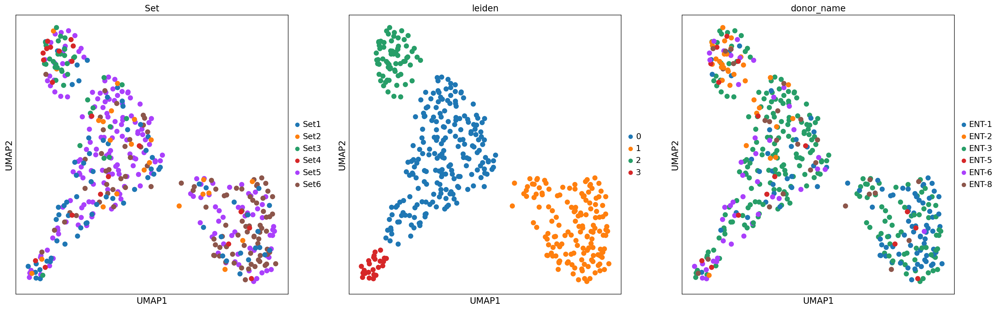

In [125]:
sc.pp.neighbors(N_adata,  n_pcs=8,n_neighbors = 30)
sc.tl.umap(N_adata)
sc.tl.leiden(N_adata, resolution=0.2)
sc.pl.umap(
    N_adata,
    color=['Set','leiden', "donor_name"],
    # Setting a smaller point size to get prevent overlap
    
)


###  annotation based on expression of markers

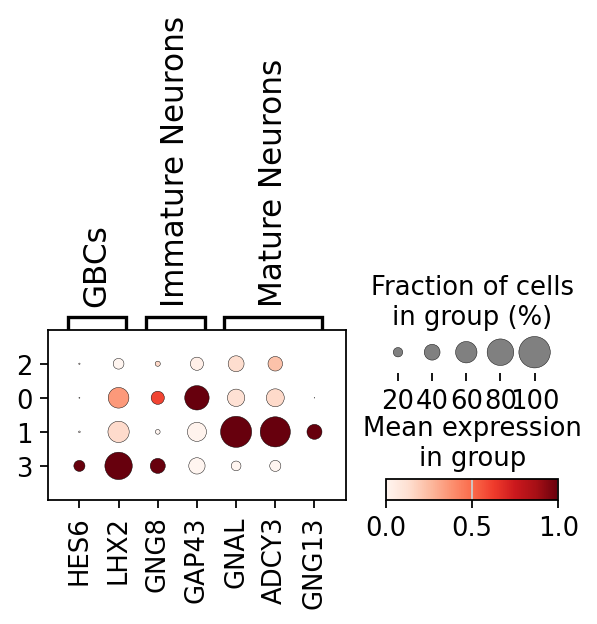

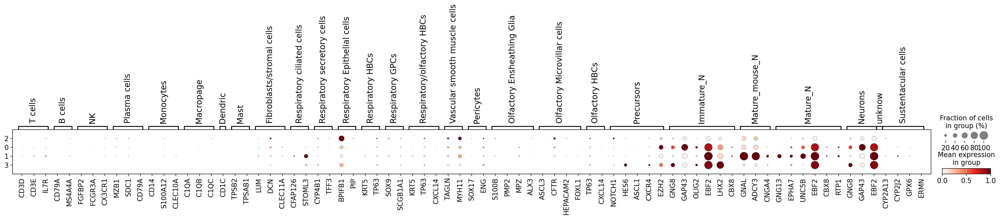

In [126]:
# maker_genes_neuro = {'GBCs': ['NOTCH1', 'HES6', 'CXCR4', 'EZH2','ASCL1','NEUROD2','KIT'],
# 'Immature Neurons': ['GNG8', 'GAP43', 'EBF2', 'LHX2'],
# 'Mature Neurons': ['GNAL', 'ADCY3','GNG13'],
#  }

maker_genes_neuro = {'GBCs': [ 'HES6','LHX2' ],
'Immature Neurons': ['GNG8', 'GAP43',],
'Mature Neurons': ['GNAL', 'ADCY3','GNG13'],
 }

marker_genes={
"T cells":['CD3D', 'CD3E', 'IL7R'],
"B cells": ['CD19', 'CD79A', 'MS4A4A'],
"NK": ['FGFBP2', 'FCGR3A', 'CX3CR1'],
"Plasma cells":["MZB1","SDC1","CD79A"],
"Monocytes":["CD14","S100A12","CLEC10A"],
"Macropage":["C1QA","C1QB","C1QC"],
"Dendric":["CD1C"],
"Mast":["TPSB2","TPSAB1"],
"Fibroblasts/stromal cells":["LUM","DCN","CLEC11A"],
"Resp. ciliated cells":["FOXJ","CFAP126","STOML3"],
"Resp. secretory cells":["MUC5","CYP4B1","TFF3",],
"Resp. Epithelial cells":['BPIFB1','PIP'],
"Resp. HBCs":["KRT5","TP63","SOX2"],
"Resp. GPCs":["SOX9","SCGB1A1"],
"Resp/Olf. HBCs":["KRT5","TP63","SOX2","CXCL14","MEG3"],
"Vascular smooth muscle cells":["TAGLN","MYH11"],
"Pericytes":["SOX17","ENG"],
#"Submucosal Gland":['TOX3','MLPH','MUC5B'],
"Olf. Ensheathing Glia":["S100B","PLP1","PMP2","MPZ","ALX3"],
"Olf. Microvillar cells":["ASCL3","CFTR","HEPACAM2","FOXL1"],
"Olf. HBCs":["TP63","CXCL14","MEG3"],
#"Progenitors":['ASCL1'],
"Precursors":["NOTCH1","HES6","ASCL1","CXCR4","SOX2","EZH2","NEUROD1","NEUROG1"],
"Immature_N":["GNG8",'GAP43',"OLIG2","EBF2","LHX2","CBX8",'TUJ1'],
"Mature_mouse_N":["GNAL","ADCY3","CNGA2","CNGA4"],
"Mature_N":["GNG13","EPHA7","UNC5B","EBF2","CBX8","RTP1"],
"Neurons":['GNG8','GAP43','EBF2'],
"unknow":[''],
"Sustentacular cells":["CYP2A13","CYP2J2","GPX6","ERMN","SOX2"]}


marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in N_adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found



import matplotlib.pyplot as plt
sc.pl.dotplot(N_adata,  maker_genes_neuro, groupby="leiden", standard_scale="var")
sc.pl.dotplot(N_adata, marker_genes_in_data, groupby="leiden", standard_scale="var")



In [127]:
new_cluster_names = {
    "3": "GBC",
    "0": "iOSN",
    "1": "mOSN",
    "2": "unknown"
}

# new_cluster_stage_names = {
#     "3": "GBC",
    
#     "2": "e_iOSN",
#     "0": "l_iOSN",
#     "4": "l_iOSN",

#     "1": "mOSN"


# }

N_adata.obs["N_types"] = N_adata.obs["leiden"].map(new_cluster_names)
#N_adata.obs["N_types_stage"] = N_adata.obs["leiden"].map(new_cluster_stage_names)


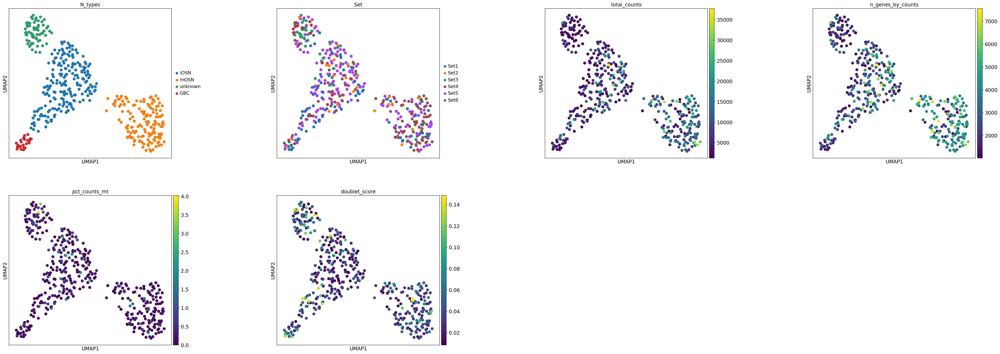

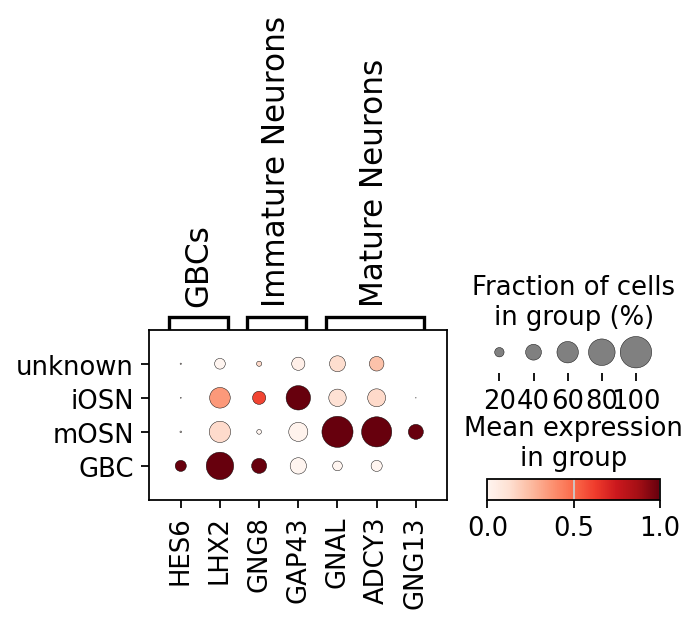

In [128]:
sc.pl.umap(
    N_adata,
    color=['N_types', 'Set',"total_counts", "n_genes_by_counts",'pct_counts_mt','doublet_score'],
    wspace=0.5,
    save='1_ENT_Neuro_qc_measures_preflt.pdf'  
)
sc.pl.dotplot(N_adata,  maker_genes_neuro, groupby="N_types", standard_scale="var",     save='1_ENT_Neuro_marker_dot_preflt.pdf'  )


In [2]:
N_adata_f = N_adata[(N_adata.obs['N_types']!='unknown'),]
sc.write(cmc_dir+"qc_scanpy/ent_N_cluster.h5ad", N_adata_f)

In [1]:

color_map = {
  "GBC":"#1a80bb",
  "iOSN":"#ea801c",
  "mOSN":"#298c8c",
 }





sc.set_figure_params(figsize=(4, 4))
sc.pl.umap(
    N_adata_f,
    legend_loc='on data',
    color=['N_types'],
    # increase horizontal space between panels
    palette=color_map,
    wspace=0.5,
    size=90,
    save='1_ENT_Neuro_types.pdf'  
)

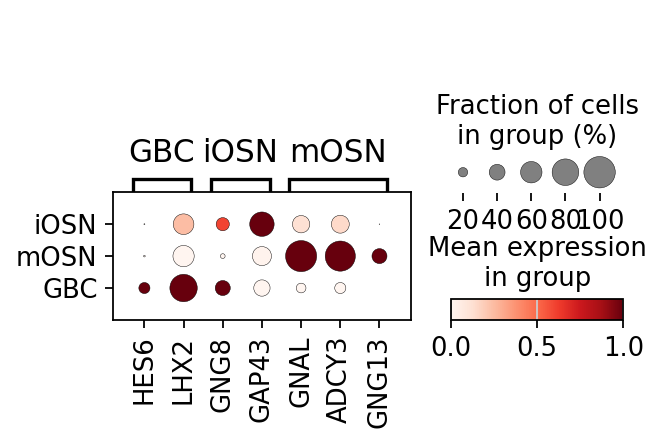

In [135]:
maker_genes_neuro = {'GBC': [ 'HES6','LHX2'],
'iOSN': ['GNG8', 'GAP43'],
'mOSN': ['GNAL', 'ADCY3','GNG13']
 }
sc.pl.dotplot(N_adata_f,  maker_genes_neuro, groupby="N_types", standard_scale="var",
             save='1_ENT_Neuro_marker_postfilt.pdf' )


GBCinp:


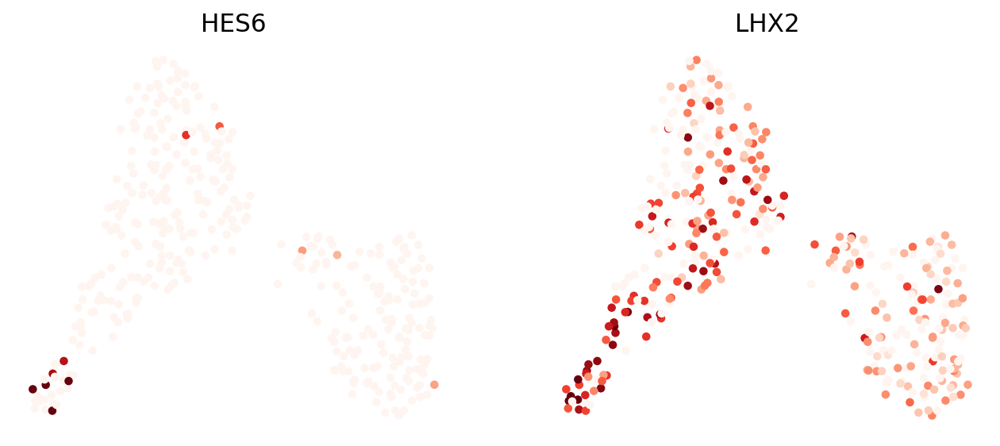

Immature Neurons:


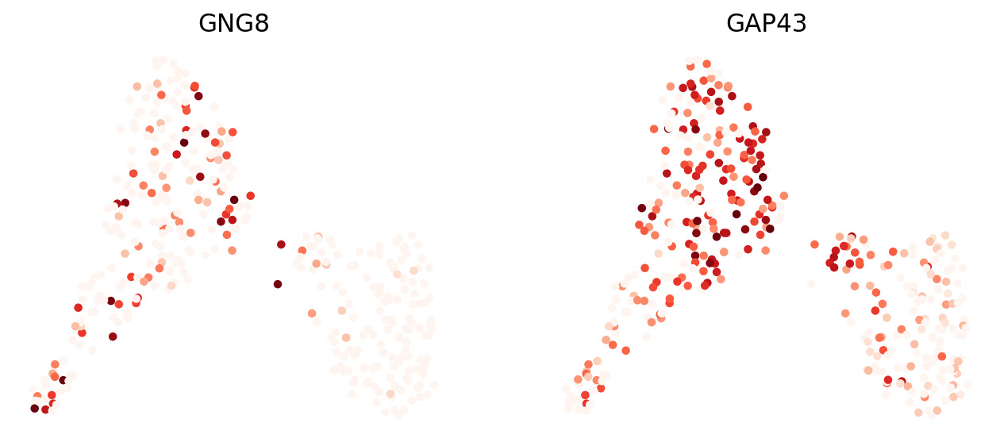

Mature Neurons:


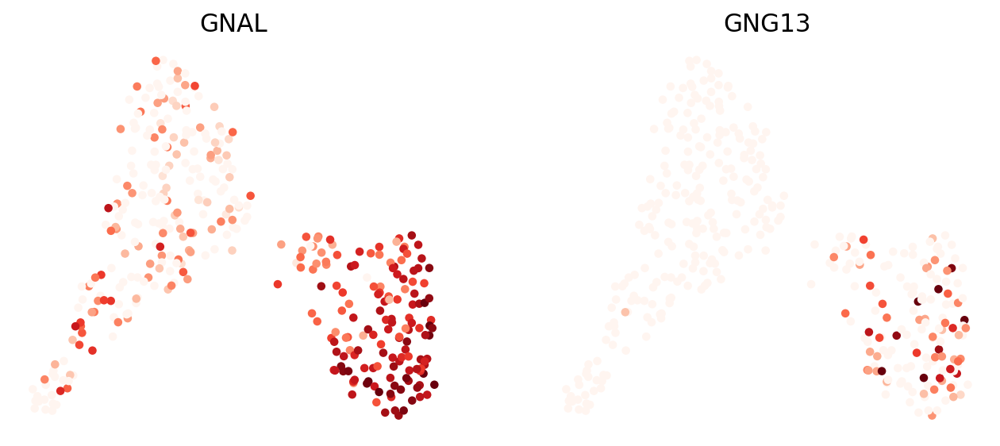

In [138]:
#sc.pp.highly_variable_genes(N_adata_f, n_top_genes=2000)

maker_genes_neuro = {
'GBCinp': ['HES6','LHX2'],#'NEUROND1','NEUROG1'#,'LHX2','EBF3'
'Immature Neurons': ['GNG8', 'GAP43'],
'Mature Neurons': ['GNAL','GNG13'],#''
 }
N_cts = list(maker_genes_neuro.keys())
for ct in N_cts:
    print(f"{ct}:")
    sc.pl.umap(
        N_adata_f,
        legend_loc = None,
        colorbar_loc=None,
        color=maker_genes_neuro[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        size=90,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    save='1_ENT_Neuro_maker'+ct+ '.pdf'    
    )
    #print("\n\n\n")


In [141]:
# N_adata_f = N_adata[(N_adata.obs['N_types']!='unknown'),]
# sc.write(cmc_dir+"qc_scanpy/ent_N_cluster.h5ad", N_adata_f)

#adata_processed = sc.read(cmc_dir+"qc_scanpy/ent_processed.h5ad")

N_adata_Mf = adata_processed[N_adata_f.obs.index]
N_adata_Mf.obs = N_adata_f.obs
#N_adata_Mf.uns = N_adata_f.uns
N_adata_Mf.obsm = N_adata_f.obsm
#N_adata_Mf.varm = N_adata_f.varm
sc.write(cmc_dir+"qc_scanpy/ent_N_cluster_rawcount.h5ad", N_adata_Mf)

In [142]:
# import matplotlib.pyplot as plt 
# import seaborn 
  
# # declaring data 
# data = N_adata_f.obs.Set.value_counts().values
# keys = N_adata_f.obs.Set.value_counts().index
  
# # define Seaborn color palette to use 
# palette_color = seaborn.color_palette('bright') 
  
# # plotting data on chart 
# plt.pie(data, labels=keys, colors=palette_color, autopct='%.0f%%') 
  
# # displaying chart 
# plt.show() 

In [143]:
N_adata_f.obs.Sex

ID
Set5_C1_AAGCGAGTCAGTCCGG    Female
Set5_C1_AATGACCAGCGTTACT    Female
Set5_C1_AGCGATTGTCGAACGA    Female
Set5_C1_AGGCTGCCAAGGTCTT    Female
Set5_C1_AGGGAGTCAATTGAAG    Female
                             ...  
Set4_C2_TCTCCGACAAGCGATG    Female
Set4_C2_TTTGACTGTTGCACGC    Female
Set4_C2_TTTGATCCACATCCCT    Female
Set4_C1_AATAGAGGTAATTGGA    Female
Set4_C1_GTCCACTAGGGCAATC    Female
Name: Sex, Length: 381, dtype: category
Categories (3, object): ['Female', 'Male', 'male']

In [7]:
import os
#os.environ['OPENBLAS_NUM_THREADS'] = '1'

import scanpy as sc
import scanpy.external as sce
import anndata as ad
import pandas as pd
# Data retrieval
import pooch
import scanpy.external as sce

sc.settings.set_figure_params(dpi=100, facecolor="white")

ensg=pd.read_table('/sc/arion/projects/roussp01a/liting/Olf/Homo.GRCh38.104.txt',index_col=0)
chr_autos = [format(x, '1d') for x in range(1,23)]
ensg_pa = ensg.loc[(ensg.chr.isin(chr_autos)) & (ensg.gene_biotype=='protein_coding'),:]

cmc_dir='/sc/arion/projects/CommonMind/roussp01a/ENT/snRNAseq/'

In [40]:
adata=sc.read_h5ad(cmc_dir+"qc_scanpy/ent_N_cluster.h5ad")
df=pd.DataFrame(adata.obsm["X_umap"])
df.to_csv('./data/ent_N_umap.txt', sep='\t', index=False)


In [5]:
 sc.tl.rank_genes_groups(adata, groupby="N_types" , method="wilcoxon")


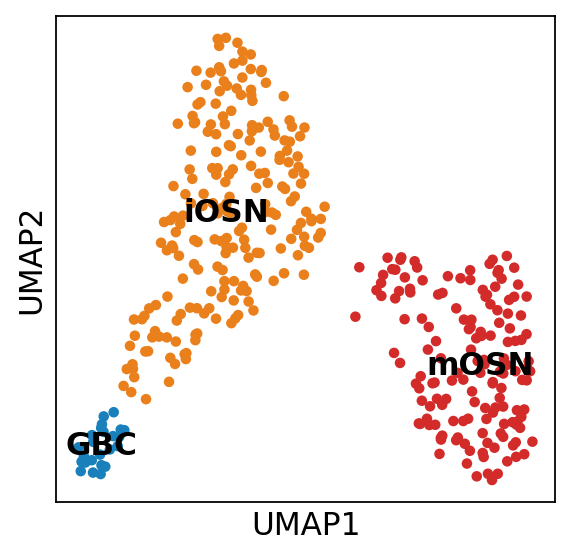

In [10]:

color_map = {
  "GBC":"#1a80bb",
  "iOSN":"#ea801c",
  "mOSN":"#D32B29",#"#298c8c",
 }



sc.set_figure_params(figsize=(4, 4))
sc.pl.umap(
    adata,
    legend_loc='on data',
    color=['N_types'],
    # increase horizontal space between panels
    palette=color_map,
    wspace=0.5,
    size=90,
    title='',
   save='1_ENT_Neuro_types.pdf'  
)

In [6]:
degs=[]
for cl in ['iOSN','mOSN','GBC']:
    deg=sc.get.rank_genes_groups_df(adata, group = cl )
    deg=deg[(deg.logfoldchanges > 1) & (deg.pvals_adj < 0.05)]
    deg['cl']=cl
    degs.append(deg)
    
combined_degs = pd.concat(degs, ignore_index=True)
combined_degs.to_csv('./figures/DEG_ent_osn.csv')

In [7]:
combined_degs

,names,scores,logfoldchanges,pvals,pvals_adj,cl
0,TRPM3,12.347991,3.144209,4.994317e-35,1.686881e-31,iOSN
1,SSBP2,10.899049,1.233879,1.164681e-27,1.035218e-24,iOSN
2,KCNMA1,9.972156,1.736014,2.018000e-23,1.175172e-20,iOSN
3,GSE1,9.457579,1.779910,3.151568e-21,1.237760e-18,iOSN
4,APBA1,8.766495,1.456749,1.843152e-18,4.788792e-16,iOSN
...,...,...,...,...,...,...
827,GATAD2B,3.416928,1.250646,6.333214e-04,3.739697e-02,GBC
828,NOL4,3.396822,1.287227,6.817322e-04,3.956390e-02,GBC
829,UBAP2,3.386291,1.283352,7.084422e-04,4.069446e-02,GBC
830,EEPD1,3.333635,2.513188,8.571921e-04,4.761928e-02,GBC


In [13]:
combined_degs.to_csv('./figures/DEG_ent_osn.csv')